### Camera Calibration

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle

# note these are 9x6 chessboard
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)

#So now we have our object points and image points we are ready to go for calibration.         
#For that we use the function, cv2.calibrateCamera(). 
#It returns the camera matrix, distortion coefficients, rotation and translation vectors etc.        
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
dist_pickle["rvecs"] = rvecs
dist_pickle["tvecs"] = tvecs
pickle.dump( dist_pickle, open( "dist_pickle.p", "wb" ) )    
print('Done')

Done


### Test undistorted calibration image

done


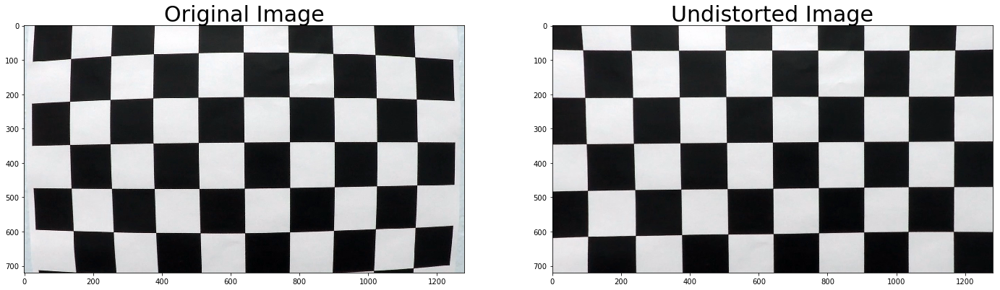

In [2]:
%matplotlib inline

def undistort(img):

    #https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_calib3d/py_calibration/py_calibration.html
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
dst = undistort(img)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig("output_images/undistorted_chessboard.png")
print('done')

### Test the undistort the highway image

done


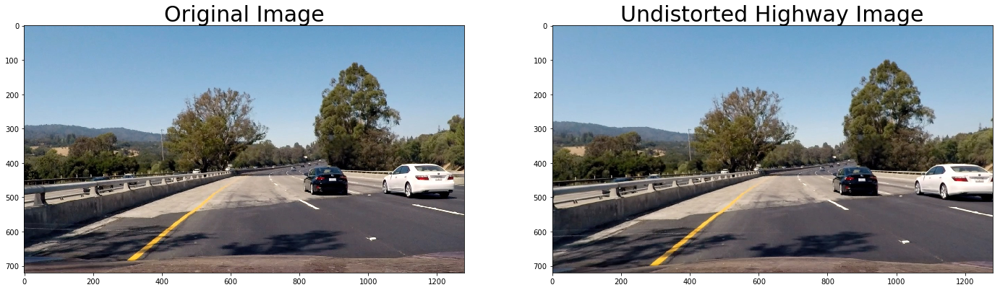

In [3]:
import matplotlib.image as mpimg
# Test undistortion on an image test4.jpg
orig_img_name_test = 'test_images/test4.jpg'
original_img = mpimg.imread(orig_img_name_test)
undistorted_img = undistort(original_img)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
ax1.imshow(original_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted_img)
ax2.set_title('Undistorted Highway Image', fontsize=30)
plt.savefig("output_images/undistorted_highway.png")
print('done')

### Applying Sobel 

Done


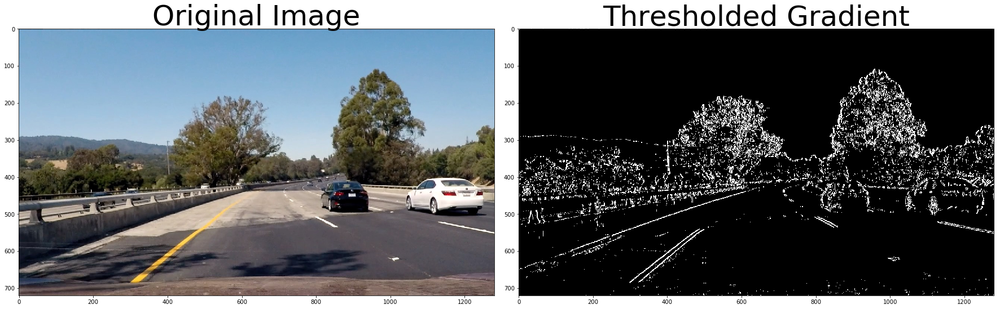

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Read in an image and Run the function with thresh 20 and 100
image = mpimg.imread(orig_img_name_test)
image = cv2.resize(image, (1280, 720)) 
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/thresholded.png") 
print('Done')

### Magnitude of the Gradient

Done


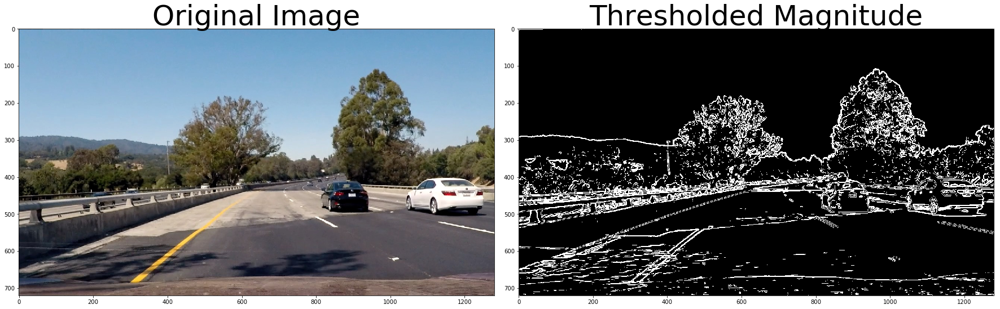

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=5, mag_thresh=(0, 255)):
    (h, w, _) = img.shape
    img = img[0:h-0, 0:w]  
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    #abs_sobelxy = sqrt{(sobel_x)^2+(sobel_y)^2}
    abs_sobelxy = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)    
    # 6) Return this mask as your binary_output image
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output
    
# Read in an image and Run the function
image = mpimg.imread(orig_img_name_test)
mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(30, 120))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/magnitude_thresholded.png") 
print('Done')

### Direction of the Gradient

Done


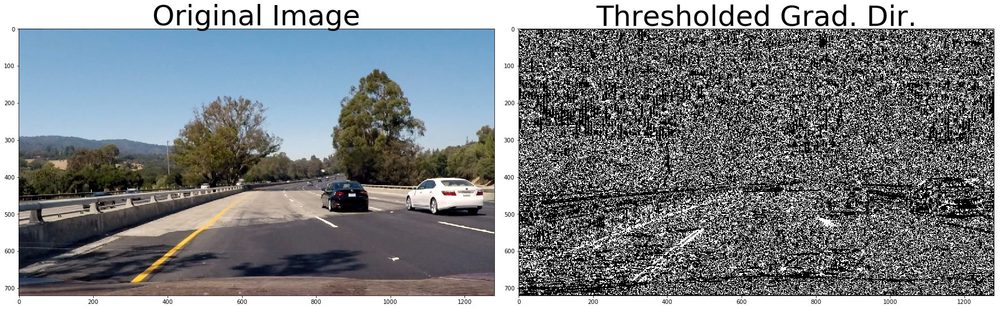

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dirgradient = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dirgradient)   
    # 6) Return this mask as your binary_output image
    binary_output[(dirgradient >= thresh[0]) & (dirgradient <= thresh[1])] = 1
    return binary_output

# Read in an image and Run the function
image = mpimg.imread(orig_img_name_test)
dir_binary = dir_threshold(image, sobel_kernel=5, thresh=(0.7, 1.3))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/dir_thresholded.png") 
print('Done')

### Combining Threshold

Done


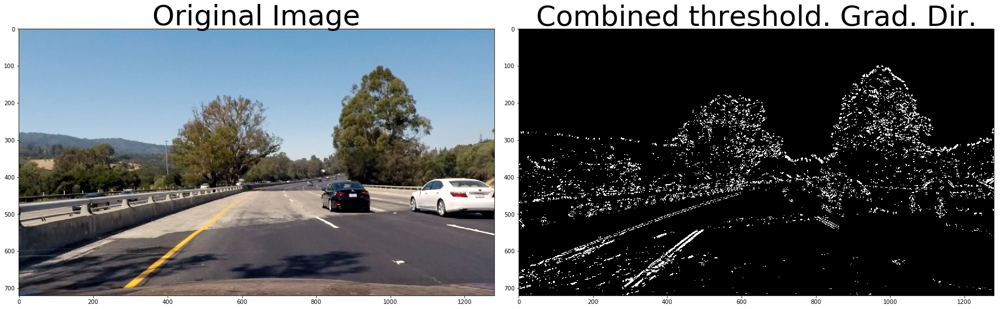

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    #abs_sobelxy = sqrt{(sobel_x)^2+(sobel_y)^2}
    abs_sobelxy = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)    
    # 6) Return this mask as your binary_output image
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dirgradient = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dirgradient)   
    # 6) Return this mask as your binary_output image
    binary_output[(dirgradient >= thresh[0]) & (dirgradient <= thresh[1])] = 1
    return binary_output

def grad_mag_dir_threshold(image, sobel_kernel=9, thresh=(30, 100), mag_thresh=(30, 100), dir_thresh=(0.7, 1.3)):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_threshold(image, sobel_kernel=ksize,  mag_thresh=(30, 100))    
    mag_binary_ = mag_threshold(image, sobel_kernel=ksize,  mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize,  thresh=(0.7, 1.3))
    _combined = np.zeros_like(dir_binary)
    _combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return _combined

# Read in an image and Run the functions
image = mpimg.imread(orig_img_name_test)
image = undistort(image)

# Choose a Sobel kernel size
ksize = 9 # Choose a larger odd number to smooth gradient measurements
combined = grad_mag_dir_threshold(image, sobel_kernel=9, thresh=(30, 100), mag_thresh=(30, 100), dir_thresh=(0.7, 1.3))
combined = grad_mag_dir_threshold(image, sobel_kernel=9)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined threshold. Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/combinations.png") 
print('Done')

### HLS 

Done


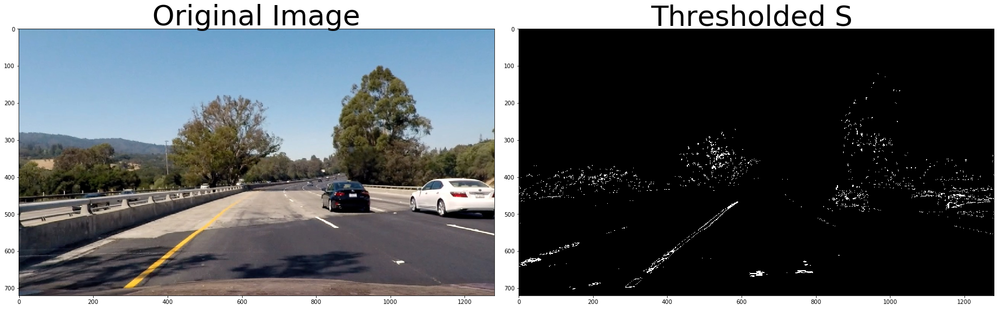

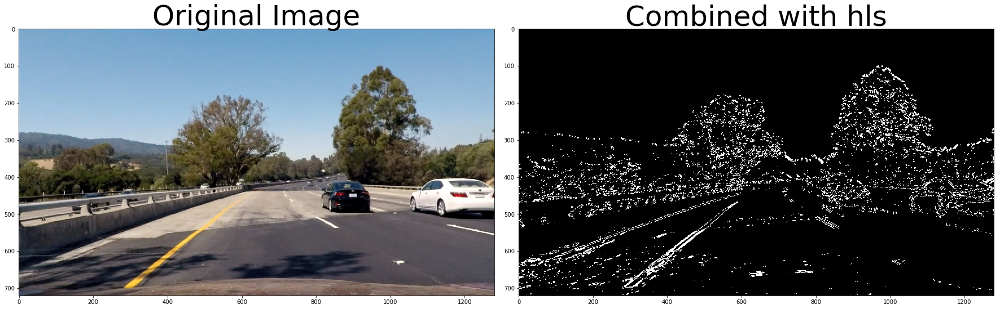

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Read in an image
image = mpimg.imread(orig_img_name_test) 
image = undistort(image)

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    S = hls[:,:,2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] =1
    # 3) Return a binary image of threshold result
    return binary_output

thresh=(155, 200)
hls_binary = hls_select(image, thresh)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title("Thresholded S ", fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#try combin with the last cell

combinedwithhls = np.zeros_like(combined)
combinedwithhls[(combined == 1) | (hls_binary == 1)] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combinedwithhls, cmap='gray')
ax2.set_title('Combined with hls', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/combination_with_hls.png") 
print('Done')

### Vidualization of the RGB channels

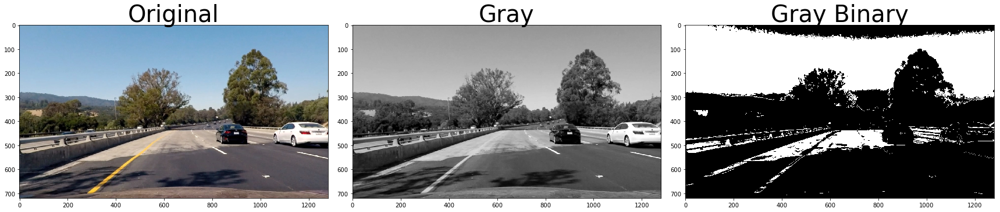

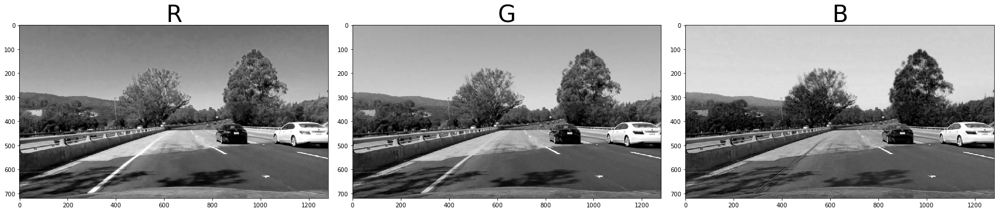

Done


In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image = mpimg.imread(orig_img_name_test)
image = undistort(image)
thresh = (155, 200)
# Convert to gray
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <=thresh[1])] =1

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 12))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original', fontsize=40)
ax2.imshow(gray, cmap='gray')
ax2.set_title('Gray', fontsize=40)
ax3.imshow(binary, cmap='gray')
ax3.set_title('Gray Binary', fontsize=40)

R = image[:, :, 0]
G = image[:, :, 1]
B = image[:, :, 2]

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 12))
f.tight_layout()
ax1.imshow(R, cmap='gray')
ax1.set_title('R', fontsize=40)
ax2.imshow(G, cmap='gray')
ax2.set_title('G', fontsize=40)
ax3.imshow(B, cmap='gray')
ax3.set_title('B', fontsize=40)
plt.show()

print('Done')

### Visulize the LAB channel

Done


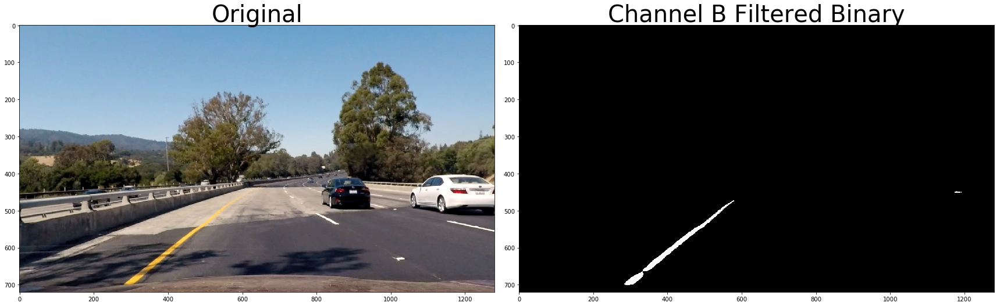

In [10]:
image = mpimg.imread(orig_img_name_test)
image = undistort(image)
def channel_b_filter(image, thresh = (160, 210)):
    # Convert to LAB color space and take the channel b
    channel_b = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)[:,:,2]
    binary = np.zeros_like(channel_b)
    binary[((channel_b > thresh[0]) & (channel_b <= thresh[1]))] = 1
    return binary

binary = channel_b_filter(image)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original', fontsize=40)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Channel B Filtered Binary', fontsize=40)

print('Done')


### Color and Gradient

Done


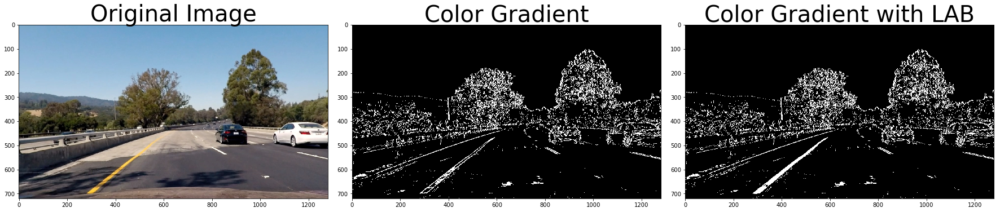

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# s_thresh=(100, 255)
def color_gradient(img, s_thresh=(150, 220), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    _combined_binary = np.zeros_like(sxbinary)
    _combined_binary[(s_binary ==1) | (sxbinary ==1)]  = 1
    return _combined_binary, s_binary

def combine_color_gradient_lab(undist):
    # Combine Color gradient and Lab B channel thresholds
    colorgradient, _ = color_gradient(undist)
    channelbfiltered = channel_b_filter(undist, thresh=(160, 210))
    combinedwithlab = np.zeros_like(colorgradient)
    combinedwithlab[(colorgradient == 1) | (channelbfiltered == 1)] = 1
    return combinedwithlab


image = mpimg.imread(orig_img_name_test)
image = undistort(image)
colorgradient, _ = color_gradient(image)
combinedwithlab = combine_color_gradient_lab(image)

# Plot the color gradient
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 12))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(colorgradient, cmap='gray')
ax2.set_title('Color Gradient', fontsize=40)

ax3.imshow(combinedwithlab, cmap='gray')
ax3.set_title('Color Gradient with LAB', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig("output_images/color_gradient_with_lab.png") 
print('Done')

### Perspective Transfer

Done


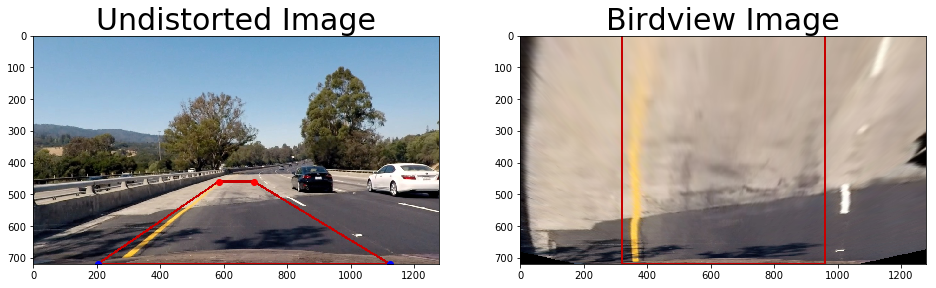

In [12]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def perspective_transfer(image):   
    img_size = (image.shape[1], image.shape[0])  

    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])   

    #  use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)        
    Minv = cv2.getPerspectiveTransform(dst, src)

    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)    
    return warped, M, Minv

#test the perspective transfer
image_ = mpimg.imread(orig_img_name_test)
undistorted_ = undistort(image_)
warped_, M, Minv = perspective_transfer(undistorted_)
src = np.float32(
[[  585.,           460.        ],
 [  203.,           720.        ],
 [ 1126.,           720.        ],
 [  695.,           460.        ]])
dst = np.float32(
[[ 320.,    0.],
 [ 320.,  720.],
 [ 960.,  720.],
 [ 960.,    0.]])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

pts = np.array([src[3], src[0], src[1], src[2]], np.int32)

pts = pts.reshape((-1,1,2))
ax1.plot([585,695], [460, 460], 'ro')
ax1.plot([203, 1126], [720,720], 'bo')
img_ = cv2.polylines(undistorted_,[pts],True,(200,0,0),5)
ax1.imshow(img_)
ax1.set_title('Undistorted Image', fontsize=30)

pts = np.array([dst[3], dst[0], dst[1], dst[2]], np.int32)

pts = pts.reshape((-1,1,2))
# Create an image to draw the lines on
warp_zero_ = np.zeros_like(warped_).astype(np.uint8)
color_warp_ = np.dstack((warp_zero_, warp_zero_, warp_zero_))
img2_ = cv2.polylines(warped_,[pts],True,(200,0,0),5)
ax2.imshow(img2_)
ax2.set_title('Birdview Image', fontsize=30)
plt.savefig("output_images/warped_example.jpg") 
print('Done')

done


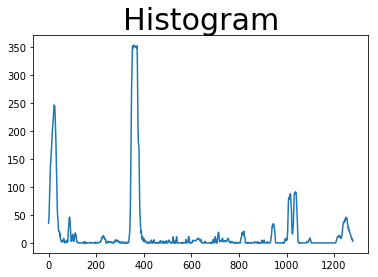

In [13]:
import numpy as np
warped, M, Minv = perspective_transfer(combinedwithlab)
# warped, M, Minv = perspective_transfer(result)
histogram = np.sum(warped[warped.shape[0]//2:, :], axis=0)
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
plt.plot(histogram)
plt.title('Histogram', fontsize=30)
plt.savefig("output_images/histogram.png")
print('done')


### Sliding Window

Done


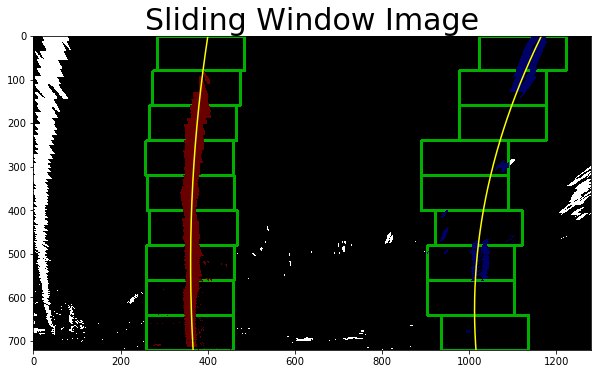

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_histogram_peaks(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    _leftx_base = np.argmax(histogram[:midpoint])
    _rightx_base = np.argmax(histogram[midpoint:]) + midpoint   
    if abs(_leftx_base -320) > 150:
        _leftx_base = 320
    if abs(_rightx_base - 960) > 150:
        _rightx_base = 960

    return _leftx_base, _rightx_base

def sliding_window(binary_warped):

    # Create an output image to draw on and visualize the result
    _out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Choose the number of sliding windows 8
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_base, rightx_base = get_histogram_peaks(warped);
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin 100
    margin = 100
    # Set minimum number of pixels found to recenter window 50
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(_out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,175,0), 6) 
        cv2.rectangle(_out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,175,0), 6) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:    
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    _out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [105, 0, 0]
    _out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 105]
   
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    _leftx_avg = np.average(leftx)
    _rightx_avg = np.average(rightx)

    # Fit a second order polynomial to each
    _left_fit, _right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:        
        _left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:    
        _right_fit = np.polyfit(righty, rightx, 2)

    return _out_img, _left_fit, _right_fit, left_lane_inds, right_lane_inds, _leftx_avg, _rightx_avg

# test sliding_window on warped

out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, _, _ = sliding_window(warped)

# Generate x and y values for plotting
ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

f, ax1 = plt.subplots(1, 1, figsize=(10,6))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
ax1.set_title('Sliding Window Image', fontsize=30)
plt.savefig("output_images/sliding_window.jpg") 
print('Done')

### Skip the sliding windows step once you know where the lines are

Done


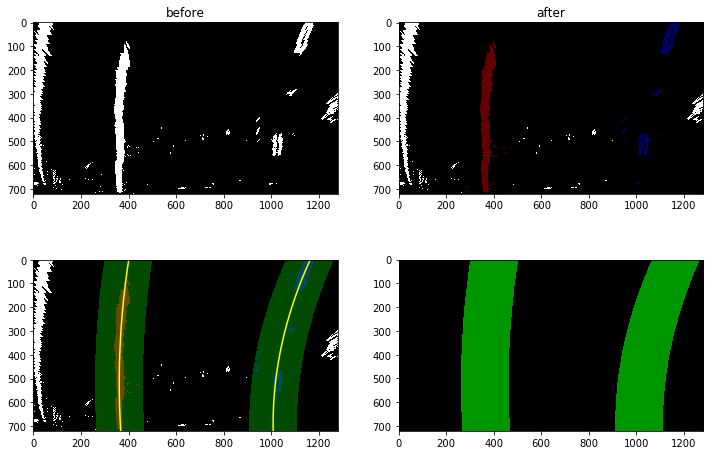

In [15]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!

def update_fit(binary_warped, left_fit, right_fit):
    if left_fit is not None and right_fit is not None:    
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        #scan the lane with the margin of 100 pixel
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        _leftx_avg = np.average(leftx)
        _rightx_avg = np.average(rightx)

        # Fit a second order polynomial to each
        _left_fit = np.polyfit(lefty, leftx, 2)
        _right_fit = np.polyfit(righty, rightx, 2)        
    else:
         _out_img, _left_fit, _right_fit, left_lane_inds, right_lane_inds, _leftx_avg, _rightx_avg \
        = sliding_window(binary_warped)
    return _left_fit, _right_fit, left_lane_inds, right_lane_inds, _leftx_avg, _rightx_avg        

# test update_fit
binary_warped = np.copy(warped)
left_fit_new, right_fit_new, left_lane_inds, right_lane_inds, _, _ = update_fit(binary_warped, left_fit, right_fit) 

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
left_fitx = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
right_fitx = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]

# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels, left lane to 
# red = [255, 0, 0]
# blue = [0, 0, 255]

f, axes = plt.subplots(2, 2, figsize=(12,8))
axes[0, 0].imshow(out_img)
axes[0, 0].set_title('before')

nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [100, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 100]

axes[0,1].imshow(out_img)
axes[0,1].set_title('after')

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
margin = 100
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,150, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,150, 0))

result_ = cv2.addWeighted(out_img, 1, window_img, 0.5, 0)
axes[1, 0].imshow(result_)
axes[1, 0].plot(left_fitx, ploty, color='yellow')
axes[1, 0].plot(right_fitx, ploty, color='yellow')

axes[1, 1].imshow(window_img)
plt.xlim(0, 1280)
plt.ylim(720, 0)
print('Done')

### Measuring Curvature

1012.67491229 m 458.277636079 m -0.294551537535 m


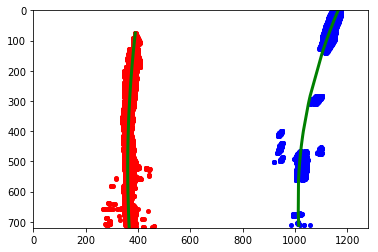

In [16]:
import numpy as np
import matplotlib.pyplot as plt

def cal_curvature(img, left_fit, right_fit, left_lane_inds, right_lane_inds):
    bottom_y = img.shape[0]
    ploty = np.linspace(0, bottom_y-1, bottom_y)# to cover same y-range as image
    y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/640 # meters per pixel in x dimension (960-320), not 700

    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    # Example values: 632.1 m    626.2 m
    # calcalate the offset
    center_of_img = img.shape[1]/2
    left_line_position = left_fit[0]*bottom_y**2 + left_fit[1]*bottom_y + left_fit[2]
    right_line_position = right_fit[0]*bottom_y**2 + right_fit[1]*bottom_y + right_fit[2]    
    lane_center_position = (left_line_position + right_line_position)/2
    center_offset = (center_of_img - lane_center_position) * xm_per_pix      

    return left_curverad, right_curverad, center_offset, left_fitx, right_fitx, leftx, lefty, rightx, righty

left_curverad, right_curverad, center_offset, left_fitx, right_fitx, leftx, lefty, rightx, righty \
= cal_curvature(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds)

print(left_curverad, 'm', right_curverad, 'm', center_offset, 'm')
    
# Plot up the fake data
mark_size = 4
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
plt.plot(leftx, lefty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, righty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, lefty, color='green', linewidth=3)
plt.plot(right_fitx, righty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

### Define the Line Class

In [17]:
from collections import deque
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None 
        
        #polynomial coefficients for the most recent number of n fits in a queue
#         self.current_fit = [np.array([False])]  
        self.current_fit = [] 
        #default number of recent fits
        self.num_of_fits = 5
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        
        #y values for detected line pixels
        self.ally = None

    def add_fit(self, fit, inds, x_avg):
        # add a found fit to the line, up to num_of_fits
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, comparesto this new fit 
                self.diffs = abs(fit-self.best_fit)
                bad_fit = self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.
                bad_fit = bad_fit or abs(x_avg-self.bestx) > 100
            if len(self.current_fit) > 0 and bad_fit:
                # bad fit, throw away
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                self.recent_xfitted.append(x_avg)
                if len(self.current_fit) > self.num_of_fits:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-self.num_of_fits:]   
                self.best_fit = np.average(self.current_fit, axis=0)
                if len(self.recent_xfitted) > self.num_of_fits:
                    # throw out old recent_xfitted
                    self.recent_xfitted = self.recent_xfitted[len(self.recent_xfitted)-self.num_of_fits:]
                self.bestx = np.average(self.recent_xfitted)    
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # push out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)
            if len(self.recent_xfitted) > 0:
                self.recent_xfitted = self.recent_xfitted[:len(self.recent_xfitted)-1]
            if len(self.recent_xfitted) > 0:
                self.bestx = np.average(self.recent_xfitted)

### Drawing the Lane Lines on to the original image

Done
[  1.45180149e-04  -1.51540921e-01   4.00363148e+02]
[  3.87996326e-04  -4.87682621e-01   1.16537803e+03]


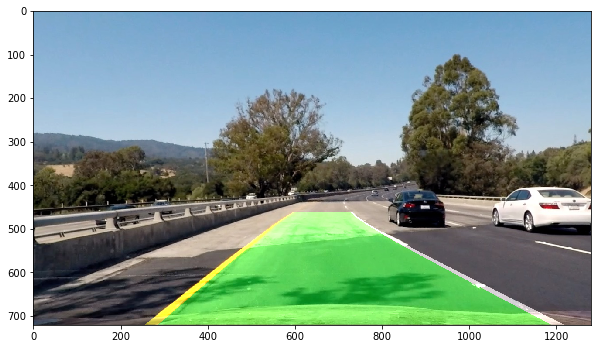

In [18]:
def draw_lanes(image, warped, left_fit, right_fit, Minv):
    yellow = (255,255,0)
    white = (255,255,255)
    new_img = image
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    hight = warped.shape[0]

    ploty = np.linspace(0, hight-1, num=hight)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=yellow, thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=white, thickness=20)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    img_with_lanes = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    
    return img_with_lanes

img_with_lanes = draw_lanes(image, warped, left_fit, right_fit, Minv)
f, ax1 = plt.subplots(1, 1, figsize=(10,6))
plt.imshow(img_with_lanes)
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.savefig("output_images/img_with_lanes.png")
print('Done')
# [  9.76913660e-06  -5.62256237e-02   3.86082363e+02]
# [  6.50743543e-04  -6.43165075e-01   1.17634797e+03]
print(left_fit)
print(right_fit)

### add text to the image

Done


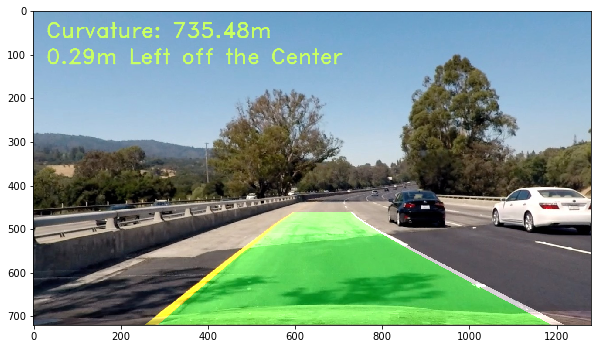

In [19]:
def add_text(image, curverad, offset):
    temp_img = np.copy(image)
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curvature: ' + '{:04.2f}'.format(curverad) + 'm'
    cv2.putText(temp_img, text, (30,60), font, 1.6, (200,255,100), 2, cv2.LINE_AA)
    direction = 'Right' if offset > 0 else 'Left' 
    offset = abs(offset)
    text = '{:04.2f}'.format(offset) + 'm ' + direction + ' off the Center'
    cv2.putText(temp_img, text, (30,120), font, 1.6, (200,255,100), 2, cv2.LINE_AA)
    return temp_img

img_with_text = add_text(img_with_lanes, (left_curverad + right_curverad)/2, center_offset)
f, ax1 = plt.subplots(1, 1, figsize=(10,6))
plt.imshow(img_with_text)
plt.savefig("output_images/img_with_text.png")
print('Done')

### Define the complete image processing pipeline

Done


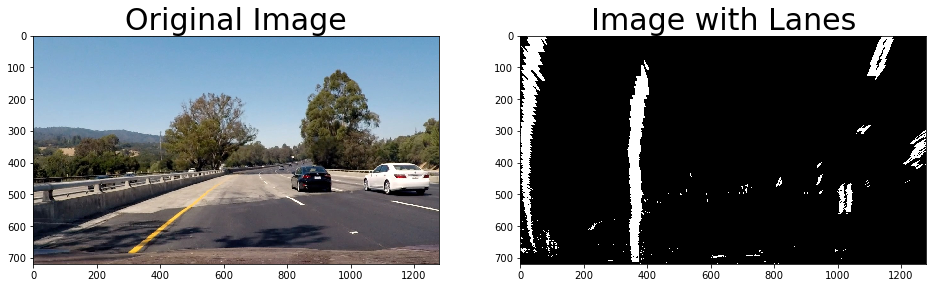

In [20]:
# Define the complete image processing pipeline, 
# reads raw image and returns binary image with lane lines identified

def pipeline(image):
    # Undistort
    undist = undistort(image)
    
#     Combine gradient, mag-threshold, and direction-threshold
#     combined = grad_mag_dir_threshold(undist, sobel_kernel=9)

    # Color gradient
#     colorgradient, _ = color_gradient(undist)    
#     combinedwithcolorgradient = np.zeros_like(combined)
#     combinedwithcolorgradient[(combined == 1) | (colorgradient == 1)] = 1        
    
    # Combine Color gradient and Lab B channel thresholds
    combinedwithlab = combine_color_gradient_lab(undist)
    
# Perspective Transform
#     warped, M, Minv = perspective_transfer(combined)
    warped, M, Minv = perspective_transfer(combinedwithlab)       
    return warped, Minv

# test pipeline
image = mpimg.imread(orig_img_name_test)
image_, Minv_ = pipeline(image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(image_, cmap='gray')
ax2.set_title('Image with Lanes', fontsize=30)
plt.savefig("output_images/pipeline_img_with_lanes.png")
print('Done')

### Define the process_image function

Done


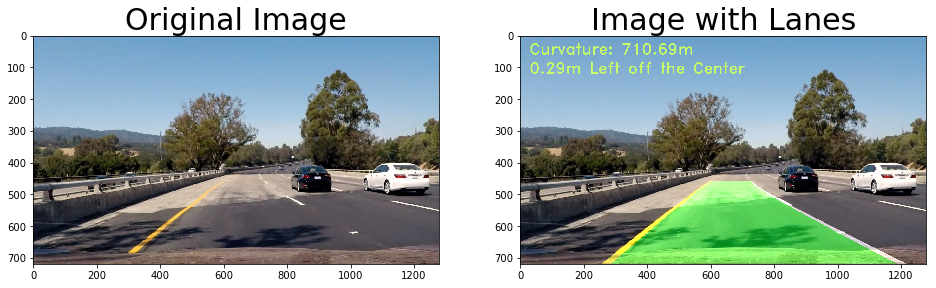

In [21]:
def process_image(binary_image): 
    new_img = binary_image
    warped, Minv = pipeline(new_img)
    
    # define the left_line and right_line as global varaibel before processing the video  
    # self.detected = False for the initalization
    # if both left and right lines were detected last frame, use update_fit, otherwise use sliding window
    if left_line.detected and right_line.detected \
    and left_line.best_fit is not None and right_line.best_fit is not None:
        left_fit, right_fit, left_lane_inds, right_lane_inds, leftx_avg, rightx_avg \
        = update_fit(warped,left_line.best_fit, right_line.best_fit)
    else:
        _, left_fit, right_fit, left_lane_inds, right_lane_inds, leftx_avg, rightx_avg \
        = sliding_window(warped)

    #check the fit, if it's out of the normal range, discart the fit
    if left_fit is not None and right_fit is not None:
        left_lane_x = left_fit[0]*image.shape[0]**2 + left_fit[1]*image.shape[0] + left_fit[2]
        right_lane_x = right_fit[0]*image.shape[0]**2 + right_fit[1]*image.shape[0] + right_fit[2]  
        if abs(left_lane_x - 320)>120 or abs(right_lane_x - 960)>120:
            left_fit = None
            right_fit = None
#             print('fit discraded!!! left = {}; right = {}'.format(left_lane_x, right_lane_x))
    # push new fit to the Line 
    left_line.add_fit(left_fit, left_lane_inds, leftx_avg)
    right_line.add_fit(right_fit, right_lane_inds, rightx_avg)
        
    # draw the current best fit if it exists        
    if left_line.best_fit is not None and right_line.best_fit is not None:
        img_out = draw_lanes(new_img, warped, left_line.best_fit, right_line.best_fit, Minv)
        
        (left_curverad, right_curverad, center_offset, left_fitx, right_fitx, leftx, lefty, rightx, righty) \
    = cal_curvature(warped, left_line.best_fit, right_line.best_fit, left_lane_inds, right_lane_inds)
        img_out = add_text(img_out, (left_curverad+right_curverad)/2, center_offset)
    else:
        img_out = image

    return img_out

image = mpimg.imread(orig_img_name_test)
left_line = Line()
right_line = Line()   
image_ = process_image(image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(image_)
ax2.set_title('Image with Lanes', fontsize=30)

print('Done')

### Test the process_image function with the test images

Done


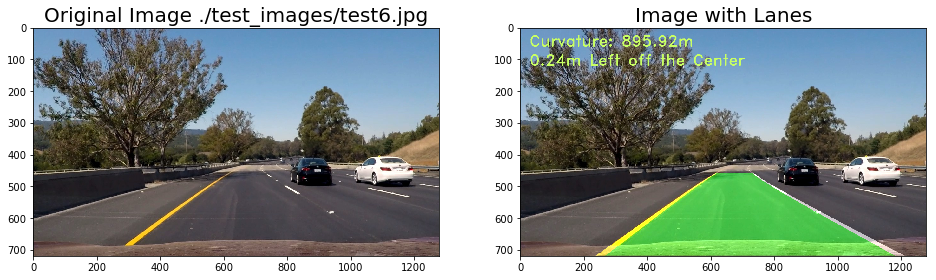

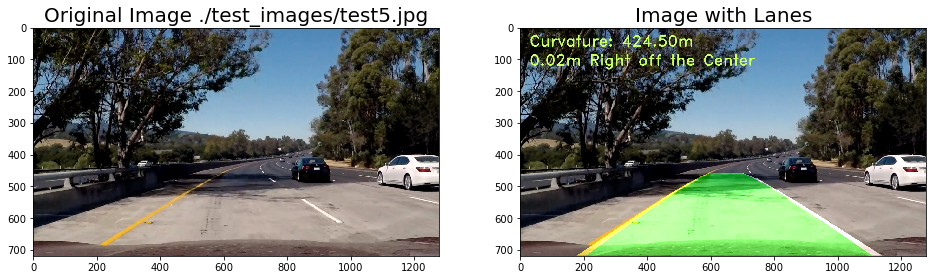

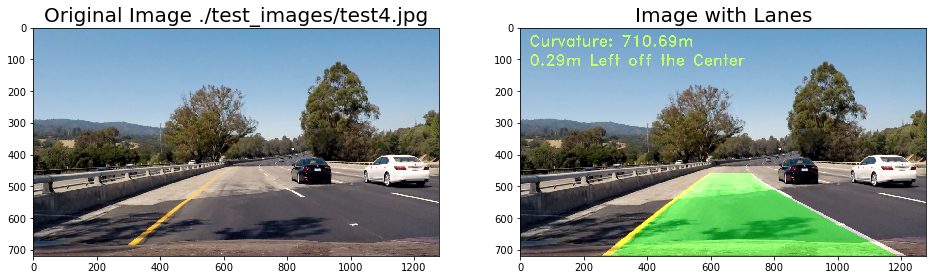

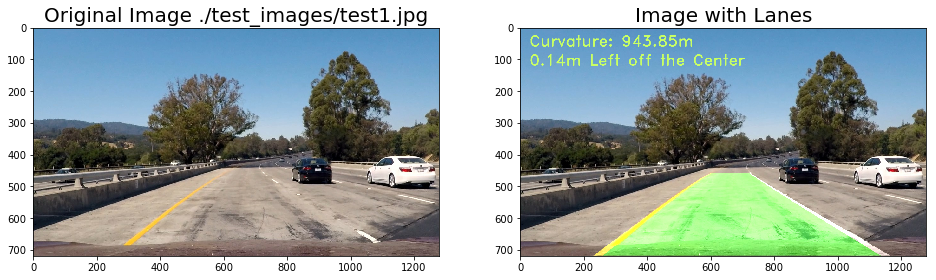

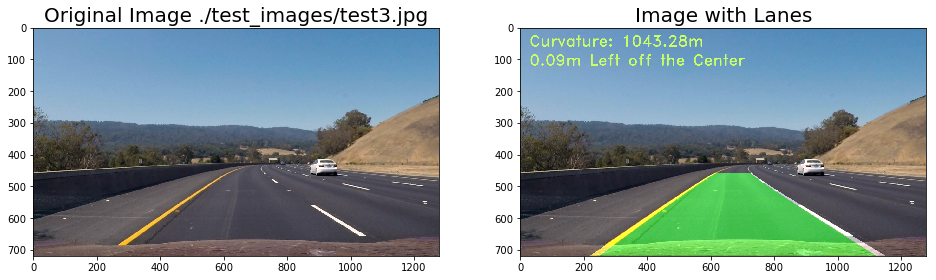

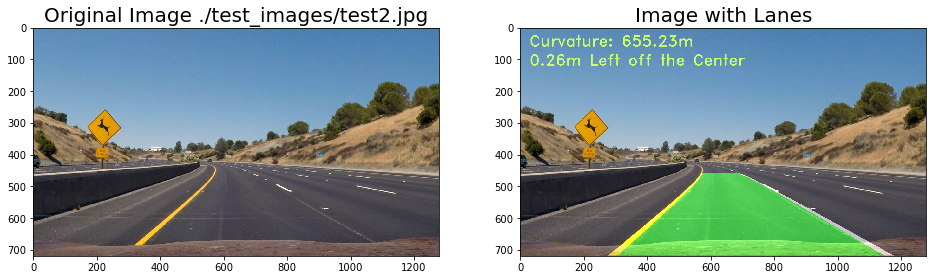

In [22]:
images = glob.glob('./test_images/test*.jpg')
  
for image_name in images:
    image = mpimg.imread(image_name)
    left_line = Line()
    right_line = Line() 
    image_ = process_image(image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ax1.imshow(image)
    ax1.set_title('Original Image '+image_name , fontsize=20)
    ax2.imshow(image_)
    ax2.set_title('Image with Lanes', fontsize=20)

print('Done')

In [23]:
from moviepy.editor import VideoFileClip
left_line = Line()
right_line = Line()   
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(0,1)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:52<00:00,  3.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 6min 43s, sys: 1min 47s, total: 8min 30s
Wall time: 5min 54s
